In [142]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from plotly import express as px
from plotly import graph_objects as go

from Bio.Phylo.TreeConstruction import DistanceTreeConstructor, DistanceMatrix
from Bio import Phylo

In [46]:
# Plots stuff
sns.set()
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['figure.dpi'] = 100 # 200 e.g. is really fine, but slower
pd.options.plotting.backend = "matplotlib"

# Build corr matrix

In [113]:
agg_zscores = pd.read_csv('zscores_agg_50.csv', index_col=0, header=0)
agg_zscores.head()

,Start,End,Start_r,End_r,Mean_Z-Score,Median_Z-Score,Sequence_id
0,0,50,0.000000,0.001681,1.189442,0.317108,AY274119.3
1,50,100,0.001681,0.003361,4.982766,2.162216,AY274119.3
2,100,150,0.003361,0.005042,23.587263,3.206895,AY274119.3
3,150,200,0.005042,0.006722,2.855947,2.237965,AY274119.3
4,200,250,0.006722,0.008403,10.819167,4.038418,AY274119.3


In [114]:
mean_z_data ={}
median_z_data ={}


for seq_id, g_df in agg_zscores.groupby('Sequence_id'):
    g_df = g_df.set_index(g_df['Start'])
    mean_zscore = g_df['Mean_Z-Score']
    median_zscore = g_df['Median_Z-Score']
    mean_z_data[seq_id] = mean_zscore
    median_z_data[seq_id] = median_zscore


mean_z_df = pd.DataFrame(mean_z_data, columns=mean_z_data.keys()).fillna(0)
median_z_df = pd.DataFrame(median_z_data, columns=median_z_data.keys()).fillna(0)
mean_z_data ={}
median_z_data ={}

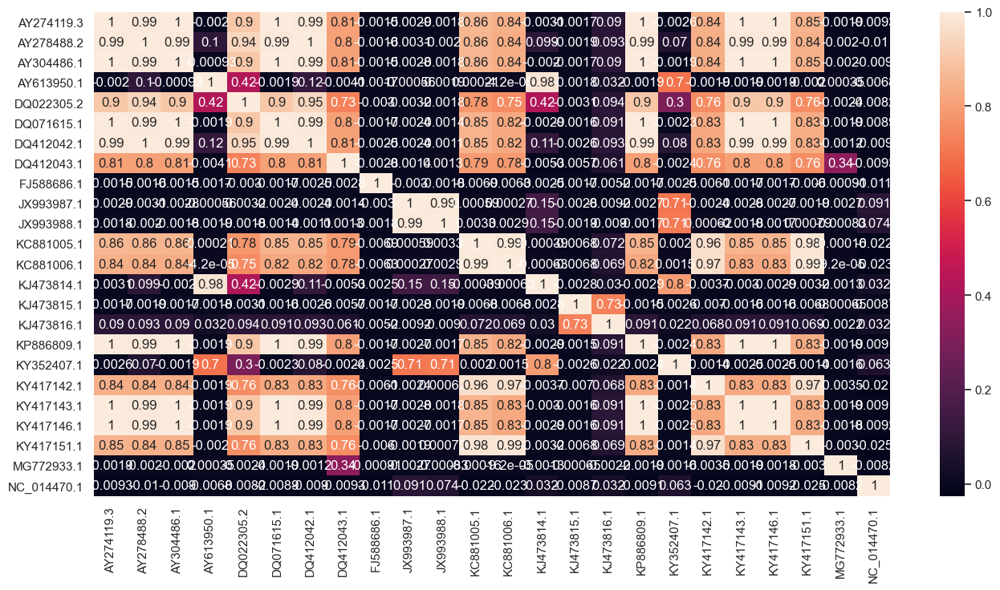

In [115]:
mean_corr_df = mean_z_df.corr()

sns.heatmap(mean_corr_df, annot=True)
plt.show()

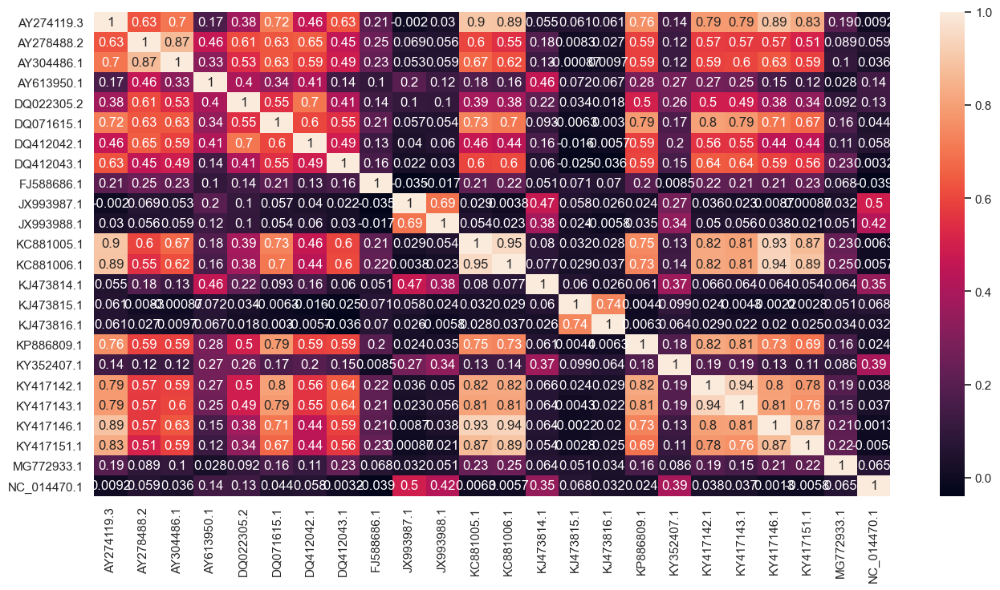

In [116]:
median_corr_df = median_z_df.corr()
sns.heatmap(median_corr_df, annot=True)
plt.show()

# Cladomgram

In [117]:
names_df = pd.read_csv('viruses.csv', index_col=0, header=None)
names_df
# names_df.drop(index=['AY274119'], inplace=True)

,1
0,
AY274119,SARS CoV Tor2
AY278488,SARS CoV BJ01
AY613950,SARS CoV PC4-227
AY304486,SARS CoV SZ3
KY417146,SARS related CoV Rs4231 CHN Rhinolophus sinicus
KY417151,SARS related CoV Rs7327 CHN Rhinolophus sinicus
KC881005,SARS related CoV RsSHC014 CHN Rhinolophus sinicus
KC881006,SARS related CoV Rs3367 CHN Rhinolophus sinicus
KJ473816,SARS related CoV YN2013 CHN Rhinolophus sinicus


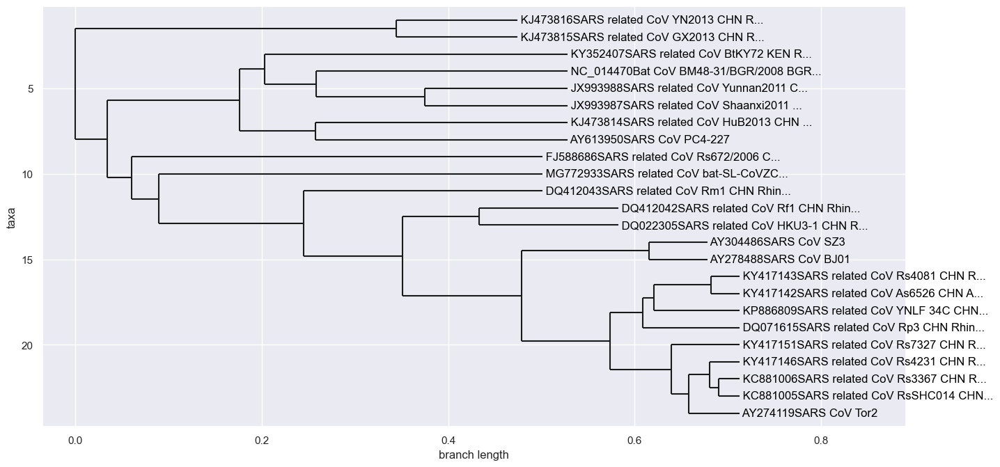

In [118]:
_lower_tri_matrix = (1 - median_corr_df).values.tolist()
lower_tri_matrix = []
for i, row in enumerate(_lower_tri_matrix):
    lower_tri_matrix.append(row[:i+1])

constructor = DistanceTreeConstructor()
median_dm = DistanceMatrix(matrix=lower_tri_matrix,
                           names=(
                               median_corr_df.index.map(
                               lambda item: item[:-2] + names_df.loc[item[:-2].replace('_', '')][1]
                               )
                           ).tolist())

UGMATree = constructor.upgma(median_dm)
for node in UGMATree.get_nonterminals():
    node.name = None
Phylo.draw(UGMATree)

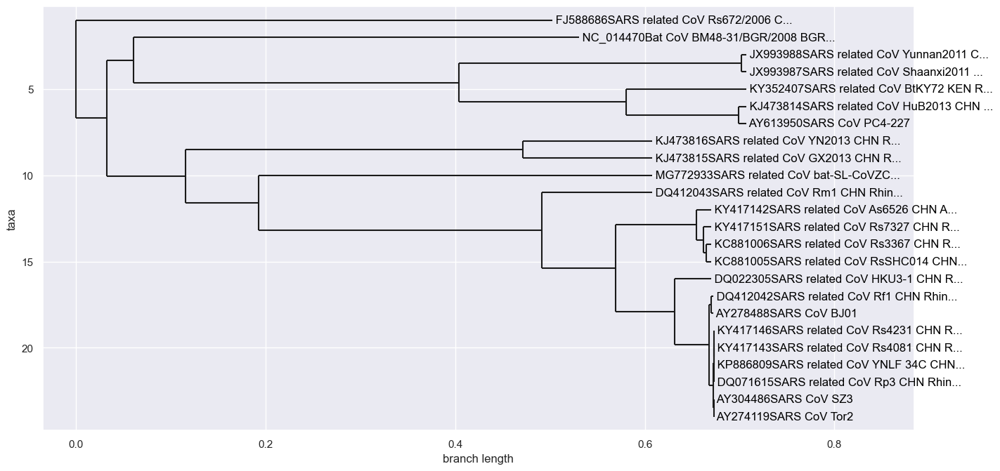

In [119]:
_lower_tri_matrix = (1 - mean_corr_df).values.tolist()
lower_tri_matrix = []
for i, row in enumerate(_lower_tri_matrix):
    lower_tri_matrix.append(row[:i+1])

constructor = DistanceTreeConstructor()
mean_dm = DistanceMatrix(matrix=lower_tri_matrix,
                           names=(
                               mean_corr_df.index.map(
                               lambda item: item[:-2] + names_df.loc[item[:-2].replace('_', '')][1]
                               )
                           ).tolist())
UGMATree = constructor.upgma(mean_dm)
for node in UGMATree.get_nonterminals():
    node.name = None
Phylo.draw(UGMATree)

# 10 bp agg

In [120]:
agg_zscores = pd.read_csv('zscores_agg_10.csv', index_col=0, header=0)
agg_zscores.head()

mean_z_data ={}
median_z_data ={}


for seq_id, g_df in agg_zscores.groupby('Sequence_id'):
    g_df = g_df.set_index(g_df['Start'])
    mean_zscore = g_df['Mean_Z-Score']
    median_zscore = g_df['Median_Z-Score']
    mean_z_data[seq_id] = mean_zscore
    median_z_data[seq_id] = median_zscore


mean_z_df = pd.DataFrame(mean_z_data, columns=mean_z_data.keys()).fillna(0)
median_z_df = pd.DataFrame(median_z_data, columns=median_z_data.keys()).fillna(0)
mean_z_data ={}
median_z_data ={}

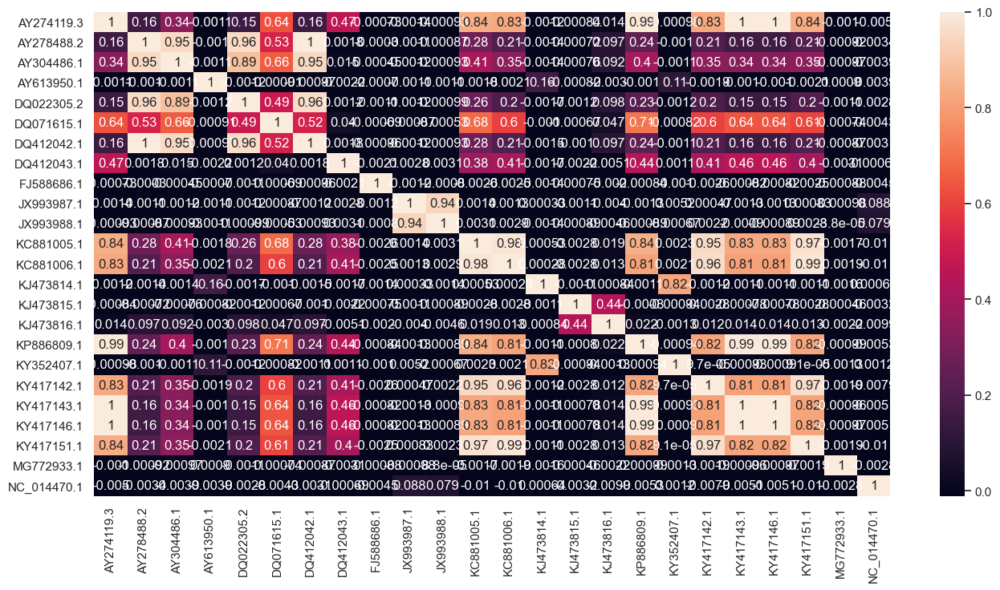

In [121]:
mean_corr_df = mean_z_df.corr()

sns.heatmap(mean_corr_df, annot=True)
plt.show()

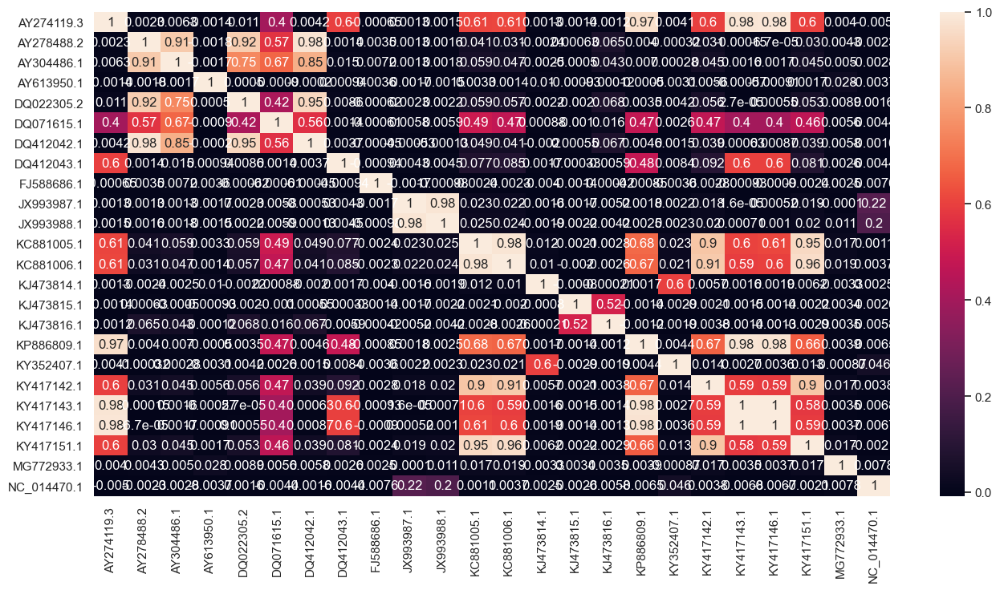

In [122]:
median_corr_df = median_z_df.corr()
sns.heatmap(median_corr_df, annot=True)
plt.show()

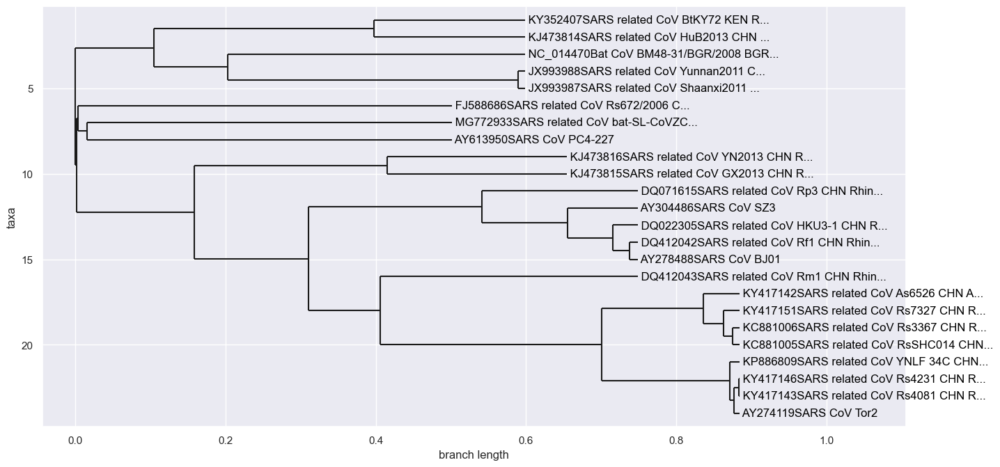

In [123]:
_lower_tri_matrix = (1 - median_corr_df).values.tolist()
lower_tri_matrix = []
for i, row in enumerate(_lower_tri_matrix):
    lower_tri_matrix.append(row[:i+1])

constructor = DistanceTreeConstructor()
median_dm = DistanceMatrix(matrix=lower_tri_matrix,
                           names=(
                               median_corr_df.index.map(
                               lambda item: item[:-2] + names_df.loc[item[:-2].replace('_', '')][1]
                               )
                           ).tolist())

UGMATree = constructor.upgma(median_dm)

for node in UGMATree.get_nonterminals():
    node.name = None
Phylo.draw(UGMATree)

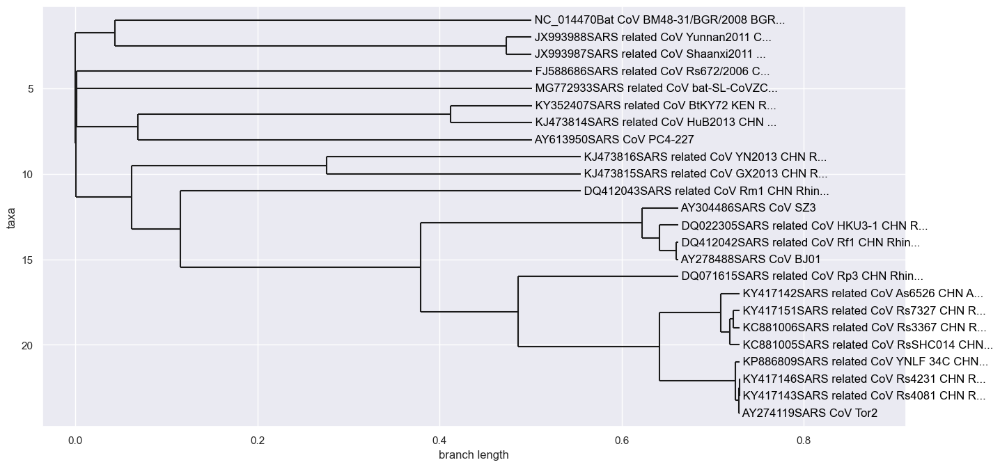

In [124]:
_lower_tri_matrix = (1 - mean_corr_df).values.tolist()
lower_tri_matrix = []
for i, row in enumerate(_lower_tri_matrix):
    lower_tri_matrix.append(row[:i+1])

constructor = DistanceTreeConstructor()
mean_dm = DistanceMatrix(matrix=lower_tri_matrix,
                           names=(
                               mean_corr_df.index.map(
                               lambda item: item[:-2] + names_df.loc[item[:-2].replace('_', '')][1]
                               )
                           ).tolist())
UGMATree = constructor.upgma(mean_dm)
for node in UGMATree.get_nonterminals():
    node.name = None
Phylo.draw(UGMATree)

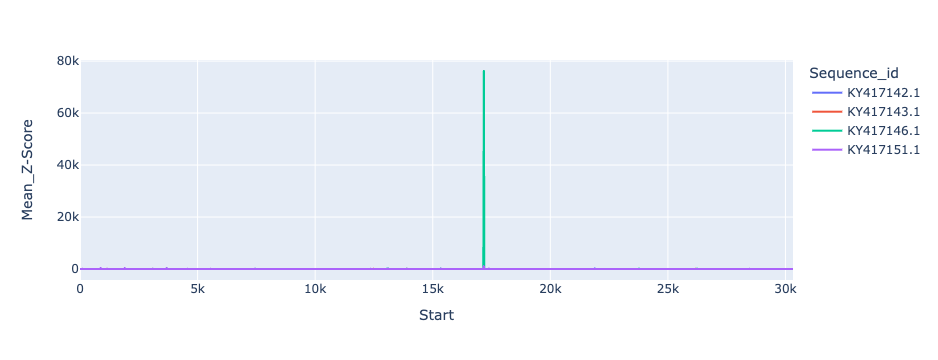

In [143]:
# fig, ax = plt.subplots(figsize=(8,6))

fig = px.line(
agg_zscores[
    agg_zscores['Sequence_id'].str.startswith('KY417')
],
x='Start', y='Mean_Z-Score', color='Sequence_id'
    
)
fig.show()

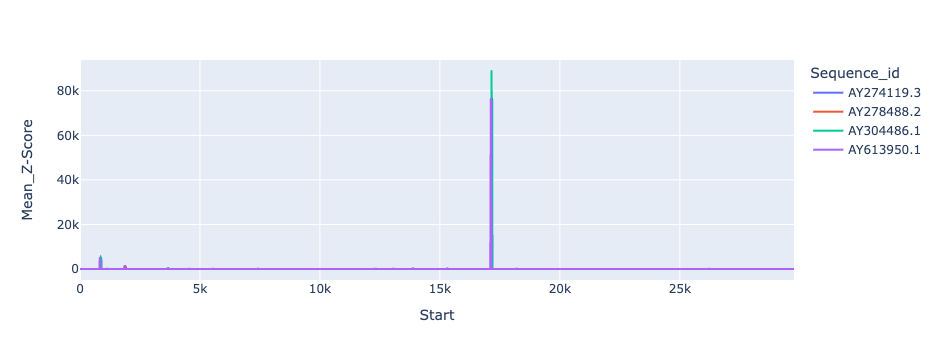

In [144]:
fig = px.line(
agg_zscores[
    agg_zscores['Sequence_id'].str.startswith('AY')
],
x='Start', y='Mean_Z-Score', color='Sequence_id'
    
)
fig.show()

In [132]:
agg_zscores['Sequence_id'].unique()

array(['AY274119.3', 'AY278488.2', 'AY304486.1', 'AY613950.1',
       'DQ071615.1', 'DQ022305.2', 'DQ412042.1', 'DQ412043.1',
       'FJ588686.1', 'NC_014470.1', 'JX993987.1', 'JX993988.1',
       'KC881005.1', 'KC881006.1', 'KJ473814.1', 'KJ473815.1',
       'KJ473816.1', 'KP886809.1', 'KY352407.1', 'KY417142.1',
       'KY417143.1', 'KY417146.1', 'KY417151.1', 'MG772933.1'],
      dtype=object)

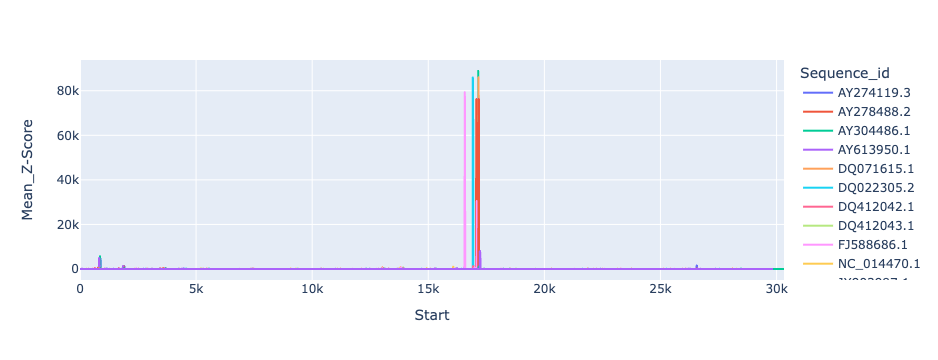

In [145]:
fig = px.line(
agg_zscores,
x='Start', y='Mean_Z-Score', color='Sequence_id'
    
)
fig.show()

In [157]:
unique_ids = pd.Series(agg_zscores['Sequence_id'].unique())

non_peak_ids = unique_ids[
    unique_ids.map(lambda _id: agg_zscores[agg_zscores['Sequence_id'] == _id
                                          ]['Mean_Z-Score'].max() < 5000)]
non_peak_ids

7      DQ412043.1
9     NC_014470.1
12     KC881005.1
13     KC881006.1
16     KJ473816.1
19     KY417142.1
22     KY417151.1
dtype: object

In [158]:
peak_ids = unique_ids[
    unique_ids.map(lambda _id: agg_zscores[agg_zscores['Sequence_id'] == _id
                                          ]['Mean_Z-Score'].max() > 10000)]
peak_ids

0     AY274119.3
1     AY278488.2
2     AY304486.1
3     AY613950.1
4     DQ071615.1
6     DQ412042.1
8     FJ588686.1
10    JX993987.1
11    JX993988.1
15    KJ473815.1
17    KP886809.1
18    KY352407.1
20    KY417143.1
21    KY417146.1
dtype: object

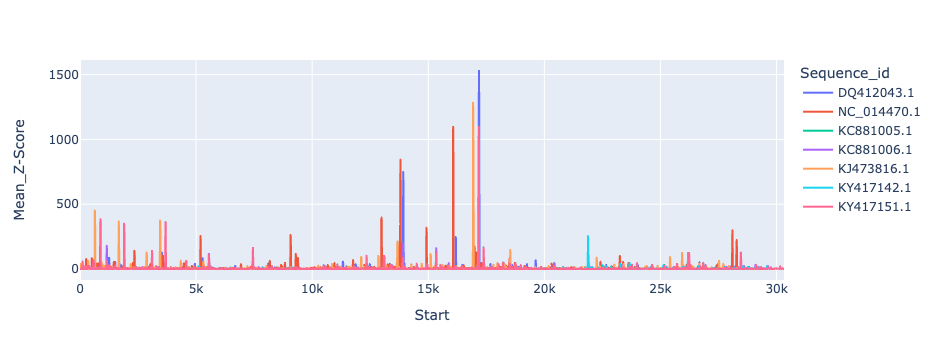

In [159]:

fig = px.line(
agg_zscores[
    agg_zscores['Sequence_id'].isin(non_peak_ids)
],
x='Start', y='Mean_Z-Score', color='Sequence_id'
    
)
fig.show()